In [1]:
from dotenv import load_dotenv
from pathlib import Path
import sys
import os

# Walk up until we find the project root (folder with the .env)
current_path = Path().resolve()
for parent in [current_path] + list(current_path.parents):
    if (parent / ".env").exists():
        load_dotenv(parent / ".env")
        project_root = os.getenv("PROJECT_ROOT")
        print(project_root)
        sys.path.append(project_root)     
        break


%load_ext autoreload
%autoreload 2

/Users/emmanuel/Documents/belugas/beluga-call-pipeline


In [2]:


import torch
import matplotlib.pyplot as plt
from datetime import timedelta

import numpy as np

import matplotlib.pyplot as plt

import time
from tqdm import tqdm
from datetime import datetime
import os
from data_preprocessing.spectrogram.spectrogram_generator import SPECT_GENERATOR, HYDROPHONE_SENSITIVITY
import pandas as pd
from models.quant_mobilenet import load_mobilenet_v3_quant_from_file
from data_preprocessing.spectrogram.spectrogram_generator import SpectrogramGenerator
from pipeline import classify, run_pipeline_batched_long_spects,get_audio_start_time, get_hydrophone_model

from vizualization import plot_pipeline_outputs_on_spects, analyze_pipeline_performance

from models.utils import get_best_device
%load_ext autoreload
%autoreload 2

# Set pandas display options to show full dataframe
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None) 
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)



The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Running the Pipeline on a Single Audio File

 This notebook demonstrates how to:
 1. Process a single audio file through the classification pipeline
 2. Visualize the detected calls on spectrograms for verification


 For processing multiple files in parallel, see `run_pipeline_parallel.py`



### Loading the model and the spectrogram generator:


In [3]:

model = load_mobilenet_v3_quant_from_file("../models/weights/mobile_net_8_layers_qat.pt", n_layers=8)

device = get_best_device()
model.to(device)
model.eval()

#spectrogram generator the model was trained on
spect_generator = SpectrogramGenerator(
        n_fft=2048,
        hop_length=1024,
        n_mels=64,
        fmin=200,
        sample_rate=192000, 
    )

/Users/emmanuel/Documents/belugas/beluga-call-pipeline/models/quant_mobilenet.py:85: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(path, map_location

### Loading the file we want to process



In [50]:
folder = "../data/CAC_2021_Labels_Ship/"
audio_file = "201359382.210714075958.wav"
audio_file_path = folder + audio_file


# print(audio_start_time)
long_audio, sample_rate, original_sr = spect_generator.load_audio(audio_file_path) 

audio_start_time = get_audio_start_time(audio_file)
hydrophone_model = get_hydrophone_model(audio_file)
hydrophone_sensitivity = HYDROPHONE_SENSITIVITY.get_sensitivity(hydrophone_model)

print(f"Hydrophone sensitivity : {hydrophone_sensitivity}")

audio_duration = len(long_audio) / sample_rate
print(f"Audio duration: {audio_duration:.0f} seconds")
print(audio_start_time)



Hydrophone sensitivity : -172.7
Audio duration: 5394 seconds
2021-07-14 07:59:58


In [51]:
original_sr

192000

### Running the pipeline on the whole file

In [5]:

results_df, summary_df = run_pipeline_batched_long_spects(
    long_audio,
    audio_start_time,
    sample_rate,
    model,
    device,
    spect_generator=spect_generator,
    debug=False,
    batch_size=128,
    call_model_window_s=1,
    hydrophone_sensitivity=hydrophone_sensitivity,
    # debug_at_s=120,
    # seconds_to_process=500,
    skip_first_n_seconds=4
)

[Thread 0] : 100%|█████████▉| 5389/5394 [00:25<00:00, 210.13it/s]

Spects generation time: 16.62 seconds
  Initial generation: 8.85 seconds
  dB conversion: 0.49 seconds
  Normalization: 0.28 seconds
  Resizing: 7.01 seconds
Inference time: 4.14 seconds
Noise calculation time: 4.61 seconds


### Summary of pipeline outputs on file :


In [6]:
summary_df

{'all_precise_noise_calc': True,
 'avg_noise_hf_range': 72.42763035813695,
 'avg_noise_w_range': 81.60154017442939,
 'avg_window_hf_range': 74.56015958433846,
 'avg_window_w_range': 82.74588977546854,
 'total_calls_detected': 4779,
 'echo_count': 3802,
 'hfpc_count': 280,
 'cc_count': 280,
 'whistle_count': 3300,
 'overall_call_rate': 53.17050088414439,
 'echo_rate': 42.292098763631564,
 'hfpc_rate': 3.114620634880809,
 'cc_rate': 3.114620634880809,
 'whistle_rate': 36.708028911095255}

### Pipeline raw outputs:

In [7]:
results_df.head(10)

,Timestamp,seconds_since_file_start,noise_calc_method,Call_Detection,ECHO,ECHO_prob,HFPC,HFPC_prob,CC,CC_prob,Whistle,Whistle_prob,db_window_w_range_mean,db_noise_w_range_mean,db_window_w_range_max,db_noise_w_range_max,db_window_w_range_min,db_noise_w_range_min,db_window_w_range_median,db_noise_w_range_median,snr_w_range_avg_window,snr_w_range_signal_active_time,snr_w_range_signal_present,snr_w_range_avg_signal,db_window_hf_range_mean,db_noise_hf_range_mean,db_window_hf_range_max,db_noise_hf_range_max,db_window_hf_range_min,db_noise_hf_range_min,db_window_hf_range_median,db_noise_hf_range_median,snr_hf_range_avg_window,snr_hf_range_signal_active_time,snr_hf_range_signal_present,snr_hf_range_avg_signal
0,2021-07-14 08:00:02,4.0,precise_with_model,1.0,True,1.0,False,0.022,False,0.0,True,1.0,81.0,77.8,135.2,119.2,56.4,55.3,77.9,76.5,7.18,0.63,1,9.85,83.0,72.7,100.3,84.3,72.5,66.9,82.7,72.7,11.10,0.98,1,11.20
1,2021-07-14 08:00:03,5.0,precise_with_model,1.0,True,1.0,False,0.419,False,0.0,True,1.0,81.7,77.8,116.7,119.2,63.3,55.3,78.4,76.5,10.93,0.70,1,14.41,85.2,72.7,102.6,84.3,74.1,66.9,84.2,72.7,12.59,0.99,1,12.63
2,2021-07-14 08:00:04,6.0,precise_with_model,1.0,True,1.0,False,0.000,False,0.0,True,1.0,82.2,77.8,117.4,119.2,59.0,55.3,79.2,76.5,11.93,0.86,1,13.32,80.4,72.7,100.3,84.3,70.3,66.9,79.3,72.7,7.35,0.61,1,10.00
3,2021-07-14 08:00:05,7.0,precise_with_model,1.0,True,1.0,False,0.000,False,0.0,True,1.0,81.9,77.8,124.9,119.2,64.4,55.3,78.8,76.5,10.71,0.79,1,12.58,78.3,72.7,96.8,84.3,68.8,66.9,76.9,72.7,5.20,0.41,1,10.07
4,2021-07-14 08:00:06,8.0,precise_with_model,1.0,True,1.0,False,0.000,False,0.0,False,0.0,80.8,77.8,117.0,119.2,58.8,55.3,77.7,76.5,5.80,0.64,1,7.09,77.2,72.7,91.4,84.3,69.7,66.9,75.8,72.7,4.24,0.32,1,10.31
5,2021-07-14 08:00:07,9.0,precise_with_model,1.0,True,1.0,True,0.975,False,0.0,True,1.0,82.0,77.8,128.1,119.2,60.4,55.3,78.8,76.5,8.94,0.81,1,10.23,76.0,72.7,90.9,84.3,68.8,66.9,74.8,72.7,3.05,0.26,1,9.32
6,2021-07-14 08:00:08,10.0,precise_with_model,1.0,True,1.0,False,0.000,False,0.0,False,0.0,81.3,77.8,117.9,119.2,63.2,55.3,78.0,76.5,7.70,0.87,1,8.35,79.9,72.7,111.4,84.3,69.4,66.9,78.0,72.7,8.11,0.44,1,13.98
7,2021-07-14 08:00:09,11.0,precise_with_model,1.0,True,1.0,False,0.000,False,0.0,False,0.0,81.3,77.8,117.7,119.2,59.6,55.3,77.4,76.5,8.78,0.90,1,9.30,80.1,72.7,111.3,84.3,71.3,66.9,79.2,72.7,7.90,0.73,1,9.21
8,2021-07-14 08:00:10,12.0,precise_with_model,1.0,True,1.0,False,0.000,False,0.0,False,0.0,81.2,77.8,116.9,119.2,63.4,55.3,76.7,76.5,9.86,0.96,1,10.13,79.1,72.7,113.5,84.3,70.5,66.9,77.7,72.7,6.75,0.36,1,12.69
9,2021-07-14 08:00:11,13.0,precise_with_model,1.0,True,1.0,False,0.000,False,0.0,True,1.0,82.1,77.8,118.1,119.2,62.8,55.3,77.6,76.5,11.71,0.98,1,11.87,76.3,72.7,111.0,84.3,68.8,66.9,75.3,72.7,3.83,0.16,1,15.29


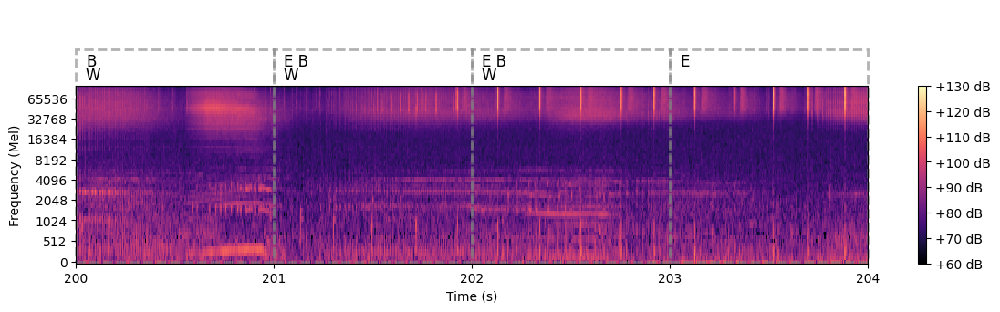

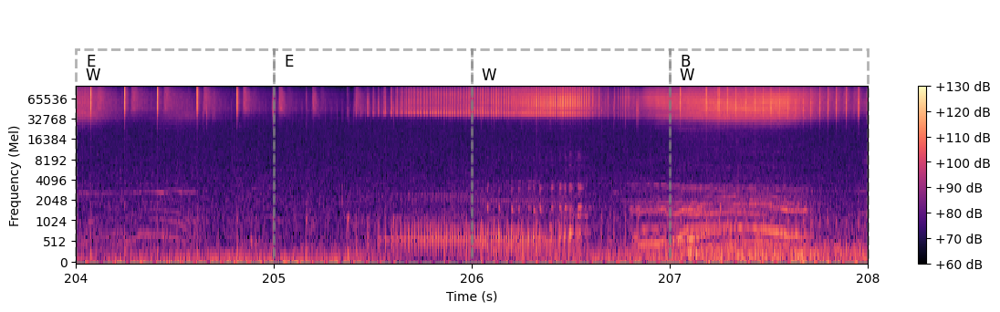

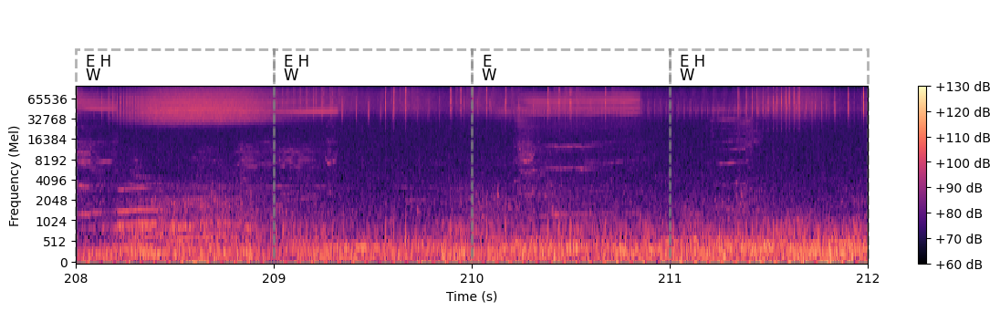

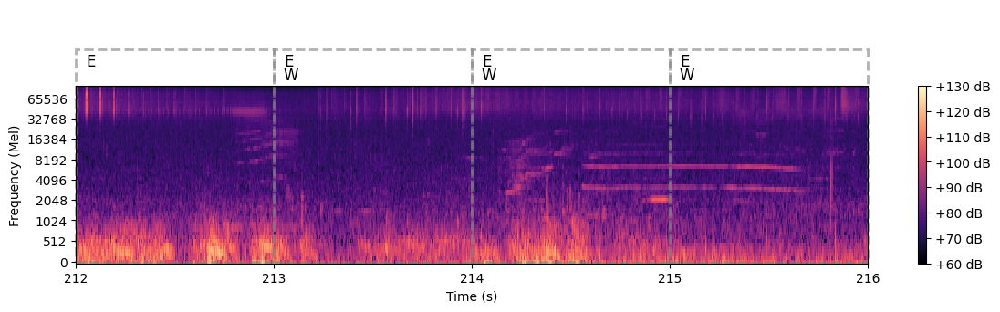

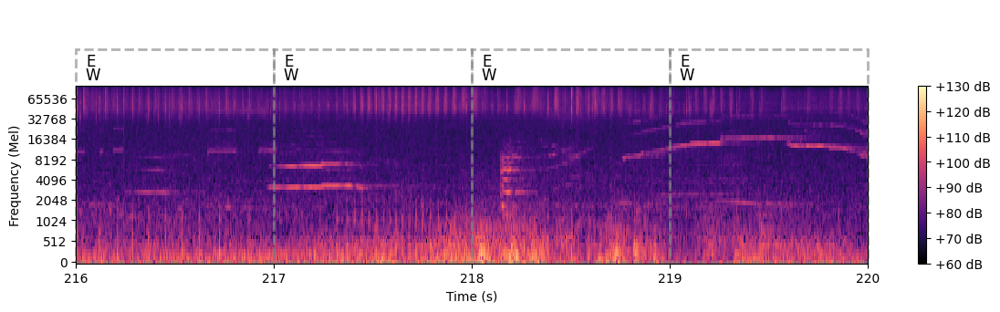

In [44]:
plot_pipeline_outputs_on_spects(
    start_from_sec=200.0,
    num_chunks=5,
    chunk_duration=4,
    show_probabilities=False,
    audio=long_audio,
    sr=sample_rate,
    results_df=results_df,
    audio_start_time=audio_start_time,
    labels=None,
    hydrophone_sensitivity=hydrophone_sensitivity,
    show_call_predictions=True,
    show_snr_stats=False,
    figsize=(14, 3.3),
    
    vmin=60,
    vmax=130,
    start_time_ticks_0=False,
    show_title=False,
)

In [18]:
results_df

,Timestamp,seconds_since_file_start,noise_calc_method,Call_Detection,ECHO,ECHO_prob,HFPC,HFPC_prob,CC,CC_prob,Whistle,Whistle_prob,db_window_w_range_mean,db_noise_w_range_mean,db_window_w_range_max,db_noise_w_range_max,db_window_w_range_min,db_noise_w_range_min,db_window_w_range_median,db_noise_w_range_median,snr_w_range_avg_window,snr_w_range_signal_active_time,snr_w_range_signal_present,snr_w_range_avg_signal,db_window_hf_range_mean,db_noise_hf_range_mean,db_window_hf_range_max,db_noise_hf_range_max,db_window_hf_range_min,db_noise_hf_range_min,db_window_hf_range_median,db_noise_hf_range_median,snr_hf_range_avg_window,snr_hf_range_signal_active_time,snr_hf_range_signal_present,snr_hf_range_avg_signal
0,2021-07-14 08:00:02,4.0,precise_with_model,1.000,True,1.000,False,0.022,False,0.000,True,1.000,81.0,77.8,135.2,119.2,56.4,55.3,77.9,76.5,7.18,0.63,1,9.85,83.0,72.7,100.3,84.3,72.5,66.9,82.7,72.7,11.10,0.98,1,11.20
1,2021-07-14 08:00:03,5.0,precise_with_model,1.000,True,1.000,False,0.419,False,0.000,True,1.000,81.7,77.8,116.7,119.2,63.3,55.3,78.4,76.5,10.93,0.70,1,14.41,85.2,72.7,102.6,84.3,74.1,66.9,84.2,72.7,12.59,0.99,1,12.63
2,2021-07-14 08:00:04,6.0,precise_with_model,1.000,True,1.000,False,0.000,False,0.000,True,1.000,82.2,77.8,117.4,119.2,59.0,55.3,79.2,76.5,11.93,0.86,1,13.32,80.4,72.7,100.3,84.3,70.3,66.9,79.3,72.7,7.35,0.61,1,10.00
3,2021-07-14 08:00:05,7.0,precise_with_model,1.000,True,1.000,False,0.000,False,0.000,True,1.000,81.9,77.8,124.9,119.2,64.4,55.3,78.8,76.5,10.71,0.79,1,12.58,78.3,72.7,96.8,84.3,68.8,66.9,76.9,72.7,5.20,0.41,1,10.07
4,2021-07-14 08:00:06,8.0,precise_with_model,1.000,True,1.000,False,0.000,False,0.000,False,0.000,80.8,77.8,117.0,119.2,58.8,55.3,77.7,76.5,5.80,0.64,1,7.09,77.2,72.7,91.4,84.3,69.7,66.9,75.8,72.7,4.24,0.32,1,10.31
5,2021-07-14 08:00:07,9.0,precise_with_model,1.000,True,1.000,True,0.975,False,0.000,True,1.000,82.0,77.8,128.1,119.2,60.4,55.3,78.8,76.5,8.94,0.81,1,10.23,76.0,72.7,90.9,84.3,68.8,66.9,74.8,72.7,3.05,0.26,1,9.32
6,2021-07-14 08:00:08,10.0,precise_with_model,1.000,True,1.000,False,0.000,False,0.000,False,0.000,81.3,77.8,117.9,119.2,63.2,55.3,78.0,76.5,7.70,0.87,1,8.35,79.9,72.7,111.4,84.3,69.4,66.9,78.0,72.7,8.11,0.44,1,13.98
7,2021-07-14 08:00:09,11.0,precise_with_model,1.000,True,1.000,False,0.000,False,0.000,False,0.000,81.3,77.8,117.7,119.2,59.6,55.3,77.4,76.5,8.78,0.90,1,9.30,80.1,72.7,111.3,84.3,71.3,66.9,79.2,72.7,7.90,0.73,1,9.21
8,2021-07-14 08:00:10,12.0,precise_with_model,1.000,True,1.000,False,0.000,False,0.000,False,0.000,81.2,77.8,116.9,119.2,63.4,55.3,76.7,76.5,9.86,0.96,1,10.13,79.1,72.7,113.5,84.3,70.5,66.9,77.7,72.7,6.75,0.36,1,12.69
9,2021-07-14 08:00:11,13.0,precise_with_model,1.000,True,1.000,False,0.000,False,0.000,True,1.000,82.1,77.8,118.1,119.2,62.8,55.3,77.6,76.5,11.71,0.98,1,11.87,76.3,72.7,111.0,84.3,68.8,66.9,75.3,72.7,3.83,0.16,1,15.29


In [10]:
def translate_to_raven(results_df, sample_rate):
    # Create new dataframe with Raven format columns
    raven_df = pd.DataFrame()
    raven_df["Selection"] = [x + 1 for x in results_df.index.tolist()]
    raven_df["View"] = "Spectrogram 1"
    raven_df["Channel"] = 1
    # Begin Time is seconds since start
    raven_df["Begin Time (s)"] = results_df["seconds_since_file_start"]
    
    # End Time is Begin Time + 1 second window
    raven_df["End Time (s)"] = results_df["seconds_since_file_start"] + 1.0
    
    # Low Freq is 0 Hz
    raven_df["Low Freq (Hz)"] = 0.0
    
    # High Freq is Nyquist frequency (sample_rate/2)
    raven_df["High Freq (Hz)"] = sample_rate / 2

    raven_df["ECHO"] = results_df["ECHO"]
    raven_df["HFPC"] = results_df["HFPC"]
    raven_df["BBPC"] = results_df["CC"]
    raven_df["Whistle"] = results_df["Whistle"]

    raven_df["GROUNDTRUTH"] = ""
    raven_df["Notes"] = ""
    
    return raven_df
    

In [19]:
hydrophone_model

'201359382'

In [53]:
def clip_and_save_audio(long_audio, sample_rate, start_s, end_s, output_filename, dir="./"):
    """
    Clip a segment from audio and save it to a file.
    
    Parameters:
    -----------
    long_audio : np.ndarray
        The full audio array (float32 from librosa)
    sample_rate : int
        Sample rate of the audio (Hz)
    start_s : float
        Start time in seconds
    end_s : float
        End time in seconds
    output_filename : str
        Filename to save the clipped audio file (should end with .wav)
    dir : str
        Directory to save the file (default: "./")
    
    Returns:
    --------
    np.ndarray
        The clipped audio segment
    """
    import soundfile as sf
    import os
    
    # Convert times to sample indices
    start_sample = int(start_s * sample_rate)
    end_sample = int(end_s * sample_rate)
    
    # Clip the audio
    clipped_audio = long_audio[start_sample:end_sample]
    
    # Ensure directory exists
    output_dir = os.path.abspath(dir)
    os.makedirs(output_dir, exist_ok=True)
    filepath = os.path.join(output_dir, output_filename)
    
    # Save using soundfile - handles float32 properly for all audio software
    sf.write(filepath, clipped_audio, sample_rate)
    
    duration = end_s - start_s
    print(f"Saved {duration:.2f}s audio clip to: {filepath}")
    print(f"Clip shape: {clipped_audio.shape}, Sample rate: {sample_rate} Hz")
    
    return clipped_audio

In [38]:
def create_snippet_df(raven_df, filename, start_s, end_s):
    audio_start_time = get_audio_start_time(audio_file)
    hydrophone_model = get_hydrophone_model(audio_file)

    snippet_df = raven_df[
            (raven_df["Begin Time (s)"] >= start_s) & 
            (raven_df["Begin Time (s)"] < end_s)
        ].copy()

    snippet_df["Begin Time (s)"] = snippet_df["Begin Time (s)"] - start_s
    snippet_df["End Time (s)"] = snippet_df["End Time (s)"] - start_s

    snippet_start_time = audio_start_time + pd.to_timedelta(start_s, unit="s")
    # Format snippet_start_time to create the date string in the filename (YYMMDDHHMMSS)
    snippet_date_str = snippet_start_time.strftime("%y%m%d%H%M%S")

    snippet_filename = f"{hydrophone_model}.{snippet_date_str}.snippet.wav"

    snippet_df["original_filename"] = filename
    snippet_df["snippet_filename"] = snippet_filename
    snippet_df["snippet_start_time"] = snippet_start_time
    snippet_df["snippet_start_s"] = start_s
    snippet_df["snippet_end_s"] = end_s

    return snippet_df, snippet_filename

    

In [39]:
raven_df = translate_to_raven(results_df, sample_rate)
# Save to tab-delimited file

In [54]:
dir = "../data/evaluation_snippets/"

# Example usage:
# Define boat passage times
boat_passage_start_s = 1667
boat_passage_end_s = 2871

start_s = boat_passage_start_s + 120
end_s = start_s + 60 * 10
boat_passage_df, snippet_filename = create_snippet_df(raven_df, audio_file, start_s, end_s)
boat_passage_df["context"] = "boat_passage"


clip_and_save_audio(long_audio, sample_rate, start_s, end_s, snippet_filename, dir)

labels_filename = snippet_filename.replace(".wav", ".selections.txt")
boat_passage_df.to_csv(dir + labels_filename, sep="\t", index=False)




start_s = 200
end_s = start_s + 60 * 10
ambient_df, snippet_filename = create_snippet_df(raven_df, audio_file, start_s, end_s)
ambient_df["context"] = "ambient"

clipped_audio = clip_and_save_audio(long_audio, sample_rate, start_s, end_s, snippet_filename, "../data/evaluation_snippets/")


labels_filename = snippet_filename.replace(".wav", ".selections.txt")
ambient_df.to_csv(dir + labels_filename, sep="\t", index=False)


Saved 600.00s audio clip to: /Users/emmanuel/Documents/belugas/beluga-call-pipeline/data/evaluation_snippets/201359382.210714082945.snippet.wav
Clip shape: (115200000,), Sample rate: 192000 Hz
Saved 600.00s audio clip to: /Users/emmanuel/Documents/belugas/beluga-call-pipeline/data/evaluation_snippets/201359382.210714080318.snippet.wav
Clip shape: (115200000,), Sample rate: 192000 Hz


In [57]:
clipped_audio

array([0.0111084 , 0.01126099, 0.01092529, ..., 0.01104736, 0.01101685,
       0.01107788], dtype=float32)

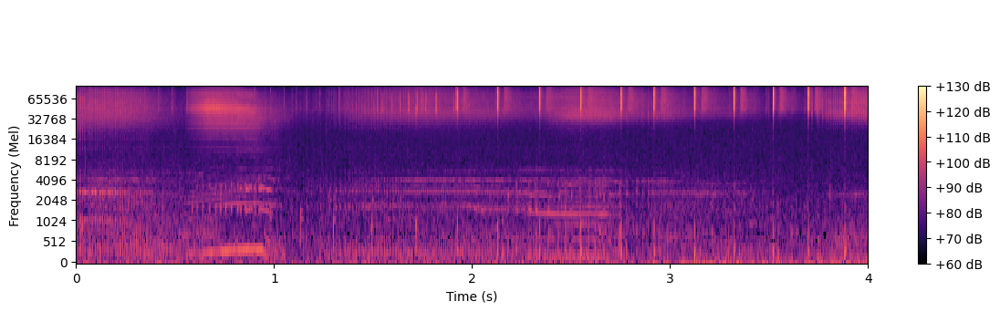

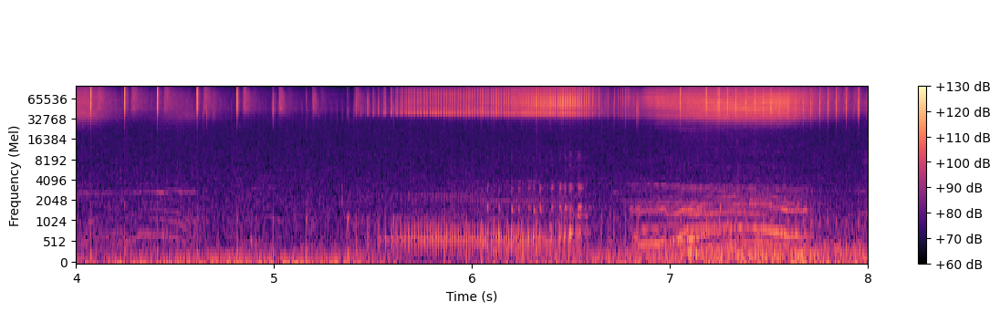

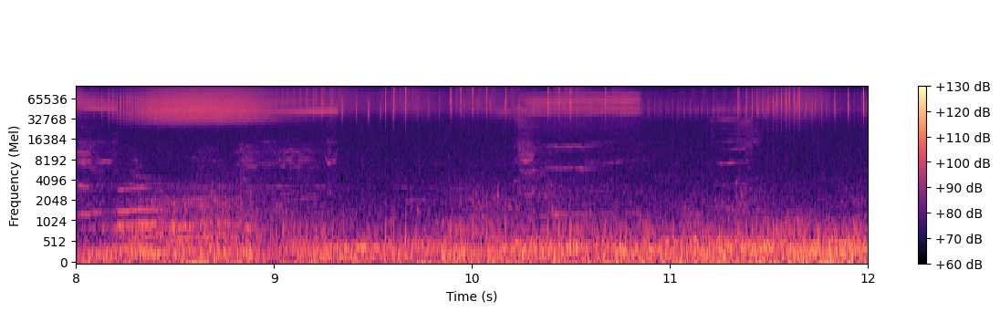

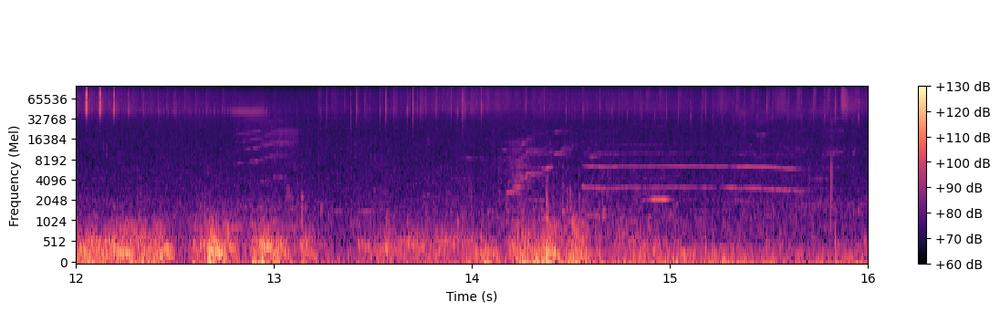

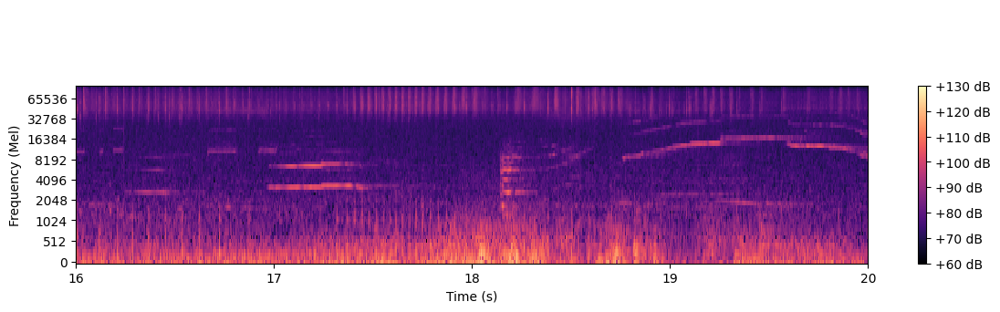

In [56]:

clipped_audio, sample_rate, original_sr = spect_generator.load_audio("../data/evaluation_snippets/"+snippet_filename) 
clipped_audio


plot_pipeline_outputs_on_spects(
    start_from_sec=0.0,
    num_chunks=5,
    chunk_duration=4,
    show_probabilities=False,
    audio=clipped_audio,
    sr=sample_rate,
    results_df=None,
    audio_start_time=audio_start_time,
    labels=None,
    hydrophone_sensitivity=hydrophone_sensitivity,
    show_call_predictions=True,
    show_snr_stats=False,
    figsize=(14, 3.3),
    
    vmin=60,
    vmax=130,
    start_time_ticks_0=False,
    show_title=False,
)


In [14]:
import numpy as np

# Define boat passage times
boat_passage_start_s = 1667.167750567
boat_passage_end_s = 2871.185005313

# Get the total audio duration to work with ambient times
audio_duration = len(long_audio) / sample_rate

# 1. Create boat passage df with 10 uniformly distributed 1-minute windows
boat_passage_duration = boat_passage_end_s - boat_passage_start_s

# Generate 10 uniformly distributed start times during boat passage
# Make sure we have room for 1-minute windows
num_moments = 10
boat_moment_starts = np.linspace(
    boat_passage_start_s, 
    boat_passage_end_s - 60,  # Subtract 60s to ensure we have room for 1-minute window
    num_moments
)

# For each moment, get all rows within 1-minute window
boat_passage_dfs = []
for start_time in boat_moment_starts:
    window_df = raven_df[
        (raven_df["Begin Time (s)"] >= start_time) & 
        (raven_df["Begin Time (s)"] < start_time + 60)
    ].copy()
    boat_passage_dfs.append(window_df)

boat_passage_df = pd.concat(boat_passage_dfs, ignore_index=True)

# 2. Create ambient df with 10 uniformly distributed 1-minute windows outside boat passage
# Split into two regions: before and after boat passage
before_boat_duration = boat_passage_start_s
after_boat_start = boat_passage_end_s
after_boat_duration = audio_duration - boat_passage_end_s

# Distribute 5 moments before and 5 moments after boat passage
ambient_moment_starts = []

# 5 moments before boat passage
if before_boat_duration > 60:
    before_moments = np.linspace(0, boat_passage_start_s - 60, 5)
    ambient_moment_starts.extend(before_moments)

# 5 moments after boat passage  
if after_boat_duration > 60:
    after_moments = np.linspace(after_boat_start, audio_duration - 60, 5)
    ambient_moment_starts.extend(after_moments)

# For each ambient moment, get all rows within 1-minute window
ambient_dfs = []
for start_time in ambient_moment_starts:
    window_df = raven_df[
        (raven_df["Begin Time (s)"] >= start_time) & 
        (raven_df["Begin Time (s)"] < start_time + 60)
    ].copy()
    ambient_dfs.append(window_df)

ambient_df = pd.concat(ambient_dfs, ignore_index=True)

# 3. Merge both into processed_pipeline_outputs_df
# Add a column to distinguish between boat passage and ambient
boat_passage_df['context'] = 'boat_passage'
ambient_df['context'] = 'ambient'

processed_pipeline_outputs_df = pd.concat(
    [boat_passage_df, ambient_df], 
    ignore_index=True
).sort_values('Begin Time (s)').reset_index(drop=True)

# Display results
print(f"Boat passage samples: {len(boat_passage_df)}")
print(f"Ambient samples: {len(ambient_df)}")
print(f"Total processed samples: {len(processed_pipeline_outputs_df)}")
print(f"\nBoat passage window start times: {boat_moment_starts}")
print(f"Ambient window start times: {ambient_moment_starts}")
print("\nProcessed pipeline outputs:")
len(processed_pipeline_outputs_df)

Boat passage samples: 600
Ambient samples: 595
Total processed samples: 1195

Boat passage window start times: [1667.16775057 1794.28077887 1921.39380718 2048.50683548 2175.61986379
 2302.73289209 2429.8459204  2556.9589487  2684.07197701 2811.18500531]
Ambient window start times: [0.0, 401.79193764175, 803.5838752835, 1205.37581292525, 1607.167750567, 2871.185005313, 3486.8675873180837, 4102.550169323167, 4718.23275132825, 5333.915333333333]

Processed pipeline outputs:


1195

In [15]:

labels_filename = audio_file.replace(".wav", ".selections.txt")
processed_pipeline_outputs_df.to_csv(folder + labels_filename, sep="\t", index=False)


## Running the pipeline on the files that were labeled


In [64]:
from pipeline import run_multi_file_pipeline_with_prefetching


def run_pipeline_subset(file_subset, raw_dir, out_dir,  process_index):

    spect_generator = SpectrogramGenerator(
            n_fft=2048,
            hop_length=1024,
            n_mels=64,
            fmin=200,
            sample_rate=192000, 
        )

    return run_multi_file_pipeline_with_prefetching(
        file_subset,
        raw_dir,
        out_dir,
        spect_generator,
        process_index=process_index,
        filter_absences=True
    )


In [ ]:
labels_folder = "../data/Labels_boats/"
site = "KAM_2020"

wavs_folder = "../data/KAM_2020/"
out_dir = "./outputs/KAM_2020/"

import os

label_files = []
labels_path = os.path.join(labels_folder, site)
for fname in os.listdir(labels_path):
    if fname.endswith(".txt"):
        # file_path = os.path.join(labels_path, fname)
        label_files.append(fname)

label_files

wav_files = []
for label_file in label_files:
    wav_file = label_file.replace(".Table.1.selections.txt", ".wav")
    wav_files.append(wav_file)

wav_files


['5725.200729105957.wav',
 '5725.200729115956.wav',
 '5725.200726185951.wav',
 '5725.200725185953.wav',
 '5725.200727105956.wav',
 '5725.200731105956.wav',
 '5725.200730125955.wav',
 '5725.200731135954.wav',
 '5725.200801095957.wav',
 '5725.200801145954.wav',
 '5725.200729095958.wav',
 '5725.200730115956.wav',
 '5725.200801155954.wav',
 '5725.200725175954.wav']

In [ ]:
run_pipeline_subset(wav_files, wavs_folder, out_dir, 0)